<a href="https://colab.research.google.com/github/suswong/DATA-602/blob/main/Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project

Your Final project should incorporate one or both of the two main themes in this course: network analysis and text processing. If you are building a model or models, explain how you evaluate the "goodness" of the chosen model and parameters.



**Group**(The DataDriven Team): Susanna Wong, Puja Roy, Mikhail Broomes & Marjete Vucinaj

**Recording:** https://drive.google.com/file/d/1oHpFlmGOyCHW6fUZwtkrt9MXNdyRK1pI/view?usp=sharing

**Google Collab Link:**
https://colab.research.google.com/drive/1aeKGGl6WI5HRxoYsJIo_6iJBVFYbTLoO?usp=sharing#scrollTo=dzV48OSXglQT

**Hi Professor Ledon,
Please click on our Google Colab link. For some reason, the notebook on Github does not show anything pass the network analysis for all of us. Thank you. - DataDriven Team*

# Motivation:
The goal of this project is to understand the patterns and relationships within Jeopardy! questions can provide insights into the shows content evolution and difficulty distribution. This analysis will be valuable to contesters and fans interested in the structure of the quiz questions and their categorizations.

We will try to predict what category a question would be based on the body of text. We will attempt to use text processing to extract features and train initial models for predicting categories.

In [ ]:
import pandas as pd
import re
import io
import networkx as nx
import numpy as np
import networkx.algorithms.bipartite as bi
import matplotlib.pyplot as plt
import nltk
from itertools import combinations
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, classification_report, roc_curve
import string
from nltk.util import ngrams
from wordcloud import WordCloud
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.utils import shuffle
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')
import random
random.seed(44)




[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


# Dataset:
The dataset contains 150,000 Jeopardy! questions in CSV format, sourced from www.j-archive.com. It contains questions from 1984 to 2012. This subset is part of a larger collection of over 500,000 questions aired on the show. It includes details such as question category, value (except for final rounds), question text, answer, round type, episode number, and air date.

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/MAB592/Data620/main/Assignments/Final%20Project/JEOPARDY_CSV_150000.csv')

# EDA

In [ ]:
df.head()

,Unnamed: 0,Show Number,Air Date,Round,Category,Value,Question,Answer
0,0,4680,2004-12-31,Jeopardy!,HISTORY,$200,"For the last 8 years of his life, Galileo was ...",Copernicus
1,1,4680,2004-12-31,Jeopardy!,ESPN's TOP 10 ALL-TIME ATHLETES,$200,No. 2: 1912 Olympian; football star at Carlisl...,Jim Thorpe
2,2,4680,2004-12-31,Jeopardy!,EVERYBODY TALKS ABOUT IT...,$200,The city of Yuma in this state has a record av...,Arizona
3,3,4680,2004-12-31,Jeopardy!,THE COMPANY LINE,$200,"In 1963, live on ""The Art Linkletter Show"", th...",McDonald's
4,4,4680,2004-12-31,Jeopardy!,EPITAPHS & TRIBUTES,$200,"Signer of the Dec. of Indep., framer of the Co...",John Adams


Count the missing values in each column

In [ ]:
df.isna().sum()

Unnamed: 0        0
Show Number       0
 Air Date         0
 Round            0
 Category         0
 Value         2510
 Question         0
 Answer           2
dtype: int64

Cleaning 'Value' column: Dropping rows with missing values and remove dollar signs '$' and commas ',' from the values. Then converted datatype to floating-point numbers.


In [ ]:
df = df.dropna()

df[' Value'] = df[' Value'].replace({'\$': '', ',': ''}, regex=True).astype(float)

Cleaning 'Question' column: Some entries in this column contain html tags of images from http://www.j-archive.com/. We remove them using the code below.

In [ ]:
def remove_html_tags(text):
  clean = re.compile('<.*?>')
  return re.sub(clean, '', text)

df[' Question'] = df[' Question'].apply(remove_html_tags)

Identifying the unique number of elements for the following columns

In [ ]:
len(df[' Question'].unique())

147068

In [ ]:
len(df[' Category'].unique())

19779

In [ ]:
df[' Round'].unique()

array(['Jeopardy!', 'Double Jeopardy!'], dtype=object)

In [ ]:
df[' Value'].unique()

array([2.000e+02, 4.000e+02, 6.000e+02, 8.000e+02, 2.000e+03, 1.000e+03,
       1.200e+03, 1.600e+03, 3.200e+03, 5.000e+03, 1.000e+02, 3.000e+02,
       5.000e+02, 1.500e+03, 4.800e+03, 1.800e+03, 1.100e+03, 2.200e+03,
       3.400e+03, 3.000e+03, 4.000e+03, 6.800e+03, 1.900e+03, 3.100e+03,
       7.000e+02, 1.400e+03, 2.800e+03, 8.000e+03, 6.000e+03, 2.400e+03,
       1.200e+04, 3.800e+03, 2.500e+03, 6.200e+03, 1.000e+04, 7.000e+03,
       1.492e+03, 7.400e+03, 1.300e+03, 7.200e+03, 2.600e+03, 3.300e+03,
       5.400e+03, 4.500e+03, 2.100e+03, 9.000e+02, 3.600e+03, 2.127e+03,
       3.670e+02, 4.400e+03, 3.500e+03, 2.900e+03, 3.900e+03, 4.100e+03,
       4.600e+03, 1.080e+04, 2.300e+03, 5.600e+03, 1.111e+03, 8.200e+03,
       5.800e+03, 7.500e+02, 7.500e+03, 1.700e+03, 9.000e+03, 6.100e+03,
       1.020e+03, 4.700e+03, 2.021e+03, 5.200e+03, 3.389e+03, 4.200e+03,
       5.000e+00, 2.001e+03, 1.263e+03, 4.637e+03, 3.201e+03, 6.600e+03,
       3.700e+03, 2.990e+03, 5.500e+03, 1.400e+04, 

In [ ]:
df[' Air Date'] = pd.to_datetime(df[' Air Date'])
df['Year'] = df[' Air Date'].dt.year

print("The data contains questions from " ,min(df['Year']),"to", max(df['Year']))

The data contains questions from  1984 to 2012


Visualizing the distribution of Rounds using bar graph. Jeopardy! and Double Jeaopardy were the highest and are majority of the rounds in the dataset.

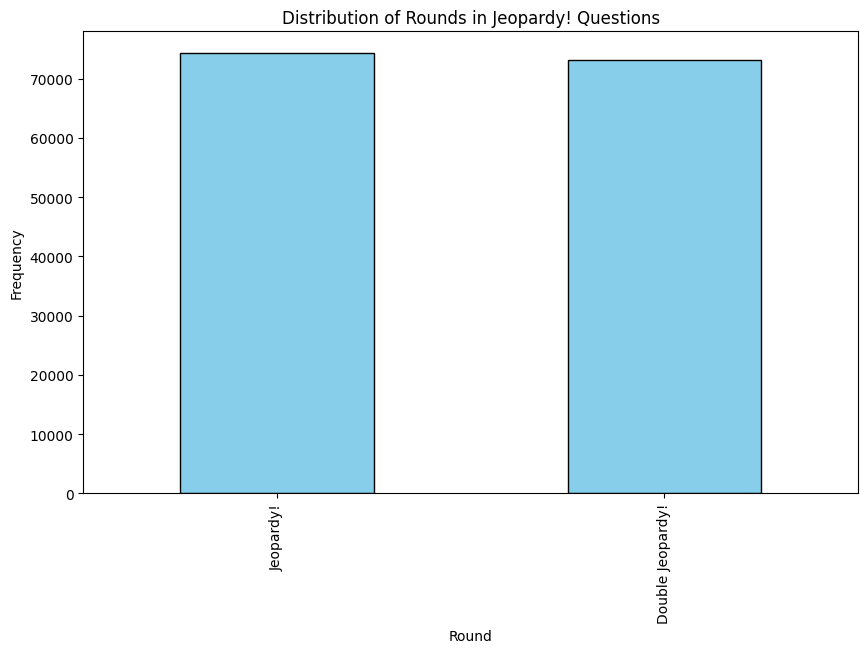

In [ ]:
round_counts = df[' Round'].value_counts()
round_counts.plot(kind='bar', color='skyblue', edgecolor='black', figsize=(10, 6))

plt.xlabel('Round')
plt.ylabel('Frequency')
plt.title('Distribution of Rounds in Jeopardy! Questions')

plt.show()


Visualizing the top 10 categories in the dataset with a bar chart and inverted the y-axis to have the highest frequency at the top. Categories Before & After, Science and Literature were the top 3.

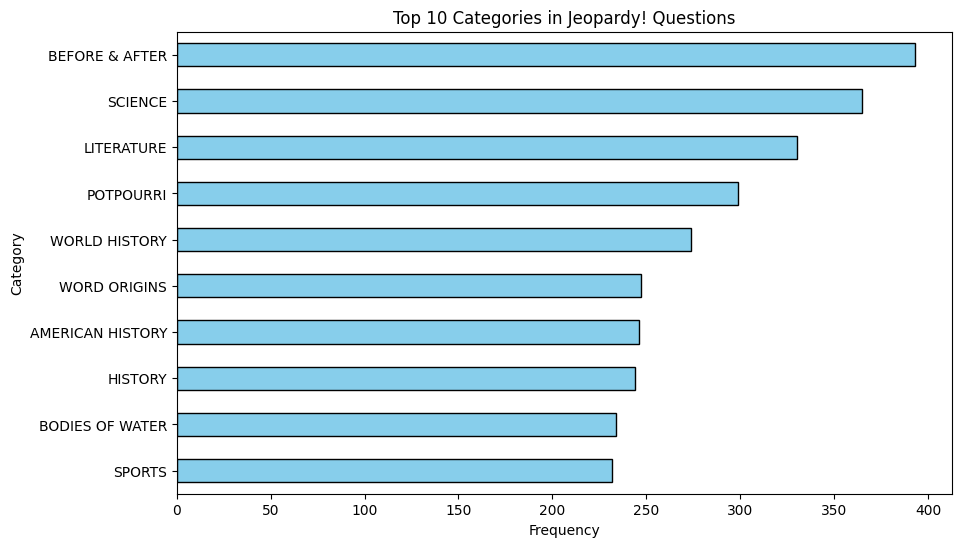

In [ ]:
top_categories = df[' Category'].value_counts().head(10)
top_categories.plot(kind='barh', figsize=(10, 6), color='skyblue', edgecolor='black')
plt.xlabel('Frequency')
plt.ylabel('Category')
plt.title('Top 10 Categories in Jeopardy! Questions')
plt.gca().invert_yaxis()
plt.show()

**Do the top categories change through out the years?**

The top categories seem to be consistent for the most part. In the past some of the categories were asked at much higher frequency, for example History was asked a 60+ times in 1997, and Before & After was asked at the highest frequency between 1997 to 2005. As we approach more recent years the categories seem to be asked in similar frequency, between 2005 and 2012 all categories were asked 30 times or less.

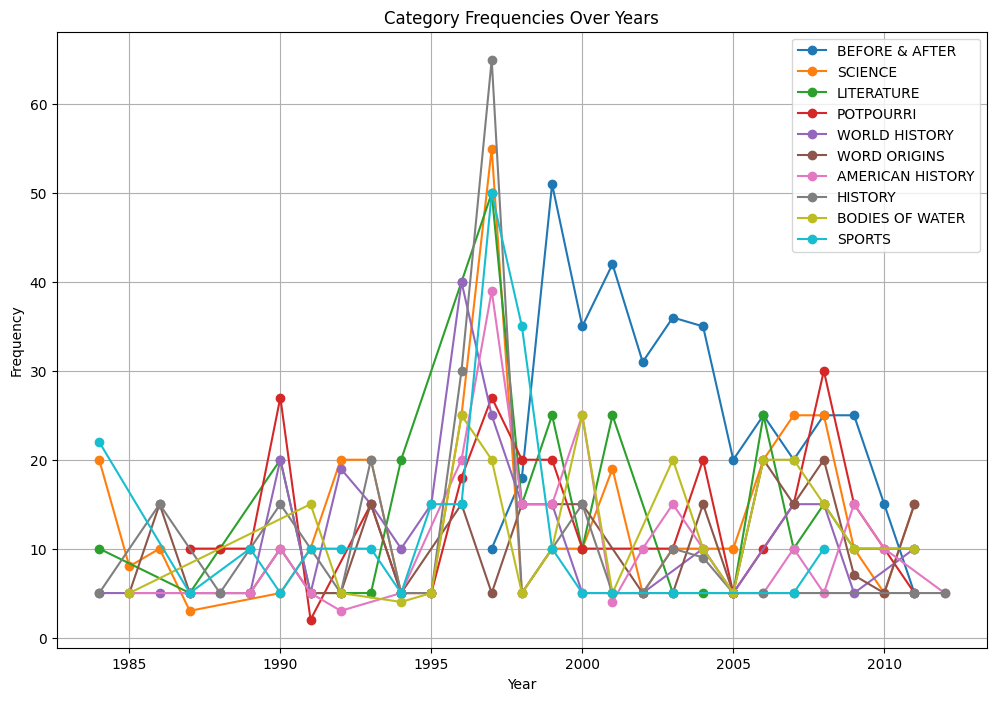

In [ ]:
df[' Air Date'] = pd.to_datetime(df[' Air Date'])
df['Year'] = df[' Air Date'].dt.year

category_counts_by_year = df.groupby(['Year', ' Category']).size().reset_index(name='Count')

# Example: Plotting category frequencies over years
plt.figure(figsize=(12, 8))
for category in top_categories.index:
    data = category_counts_by_year[category_counts_by_year[' Category'] == category]
    plt.plot(data['Year'], data['Count'], marker='o', label=category)

plt.title('Category Frequencies Over Years')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.show()


This graph shows the category frequencies over years for top 5 categories.


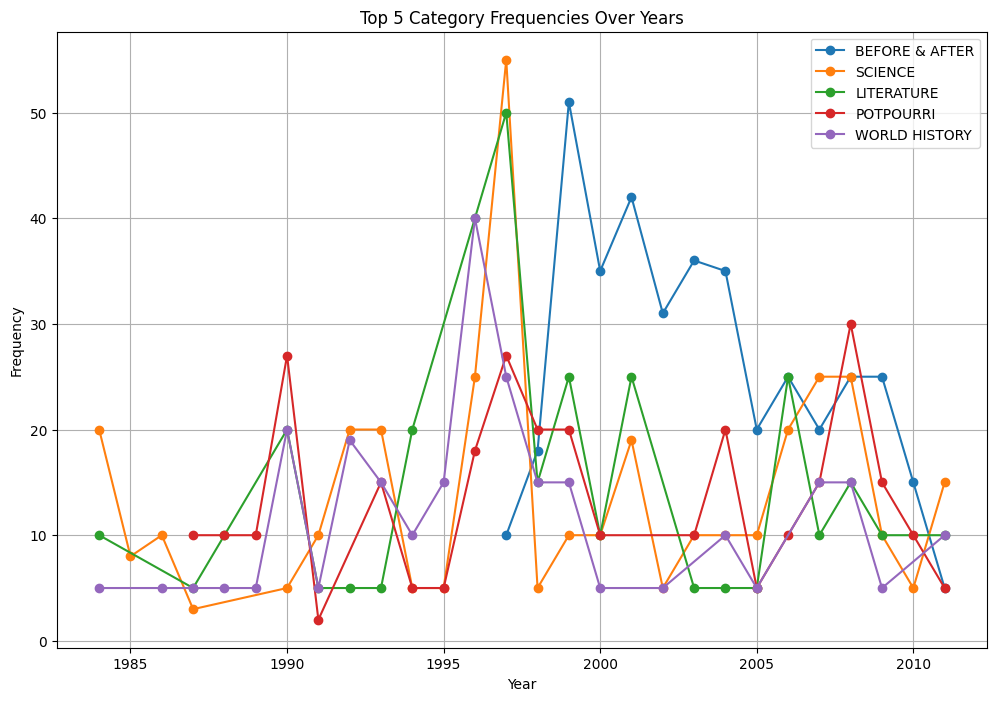

In [ ]:
top_5 = category_counts_by_year.groupby(' Category')['Count'].sum().nlargest(5).index

plt.figure(figsize=(12, 8))
for category in top_5:
    data = category_counts_by_year[category_counts_by_year[' Category'] == category]
    plt.plot(data['Year'], data['Count'], marker='o', label=category)

plt.title('Top 5 Category Frequencies Over Years')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.show()

# Normalized frequencies

We wanted to investigate normal frequencies since raw count can be misleading. We visualized the normal frequency of the top categories over the years using the proportion of questions per category relative to the total questions per year. For example, Literature(dark green), which is considered top 5 categories, had the highest number of questions in 1997, but this proportion only accounts of 0.05% of the questions. This is due to the numerous amount of categories present.

We also see from both the graphs above and below that 'before and after' is a new category in late 1990's.

Although the results of "Total Questions per Year" looks like some years have more questions than others, it important to remember that our dataset was a subset of the original and thus are unable to make conclusions about any potential change in number of questions over time.



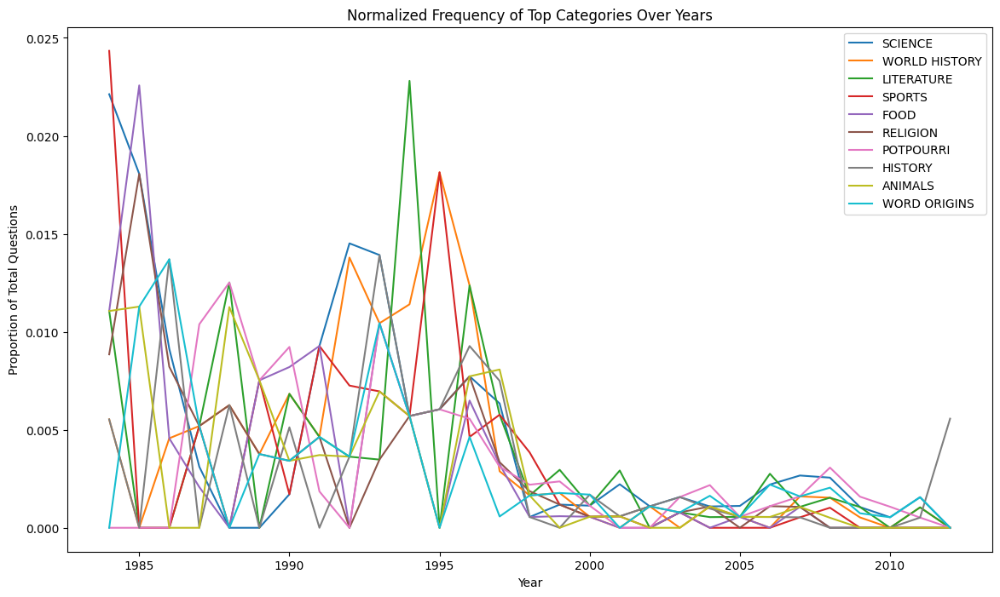

In [ ]:
total_questions_per_year = df.groupby('Year')[' Question'].count()
questions_per_category_per_year = df.groupby(['Year', ' Category'])[' Question'].count().unstack(fill_value=0)
normalized_frequencies = questions_per_category_per_year.div(total_questions_per_year, axis=0)

# Select top N categories to plot
top_n_categories = 10
top_categories = normalized_frequencies.sum().sort_values(ascending=False).head(top_n_categories).index

# Filter the normalized frequencies to include only the top N categories
normalized_frequencies_top = normalized_frequencies[top_categories]

# Plot
plt.figure(figsize=(14, 8))
for category in top_categories:
    plt.plot(normalized_frequencies_top.index, normalized_frequencies_top[category], label=category)

plt.xlabel('Year')
plt.ylabel('Proportion of Total Questions')
plt.title('Normalized Frequency of Top Categories Over Years')
plt.legend()
plt.show()

In [ ]:
# Identify top 3 categories based on total questions
top_categories = questions_per_category_per_year.sum().sort_values(ascending=False).head(5).index

# Filter the results for the top 5 categories
questions_per_category_per_year_top = questions_per_category_per_year[top_categories]
normalized_frequencies_top = normalized_frequencies[top_categories]

print("Questions Per Category Per Year (Top 5 Categories):")
print(questions_per_category_per_year_top)
print()

print("Normalized Frequencies (Top 5 Categories):")
print(normalized_frequencies_top)


Questions Per Category Per Year (Top 5 Categories):
 Category  BEFORE & AFTER  SCIENCE  LITERATURE  POTPOURRI  WORLD HISTORY
Year                                                                    
1984                    0       20          10          0              5
1985                    0        8           0          0              0
1986                    0       10           0          0              5
1987                    0        3           5         10              5
1988                    0        0          10         10              5
1989                    0        0           0         10              5
1990                    0        5          20         27             20
1991                    0       10           5          2              5
1992                    0       20           5          0             19
1993                    0       20           5         15             15
1994                    0        5          20          5             10

In [ ]:
 #Count total questions per year
total_questions_per_year = df.groupby('Year')[' Question'].count()

# Count questions per category per year
questions_per_category_per_year = df.groupby(['Year', ' Category'])[' Question'].count().unstack(fill_value=0)

# Print results
print("Total Questions per Year:")
print(total_questions_per_year)


Total Questions per Year:
Year
1984     904
1985     443
1986    1095
1987     963
1988     799
1989    1329
1990    2926
1991    1078
1992    1378
1993    1437
1994     877
1995     827
1996    3235
1997    8667
1998    9100
1999    8452
2000    8860
2001    8556
2002    4568
2003    6379
2004    9190
2005    8961
2006    9066
2007    9372
2008    9769
2009    9448
2010    9303
2011    9608
2012     898
Name:  Question, dtype: int64


# Text Processing

**Frequency Analysis: Identify the most common words or phrases in the questions or answers**

Text preprocessing: Define the function, convert text to lowercase, remove punctuation, parenthesis, tokenize text, and remove stop words, then apply the function to the Question column

In [ ]:
def clean_text(text):
    text = re.sub(r'\([^)]*\)', '', text)
    text = text.lower()
    text = text.translate(str.maketrans('', '', string.punctuation))
    text = re.sub(r'\b(clue|crew)\b', '', text)
    words = word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]
    return ' '.join(words)

df['Cleaned_Question'] = df[' Question'].apply(clean_text)


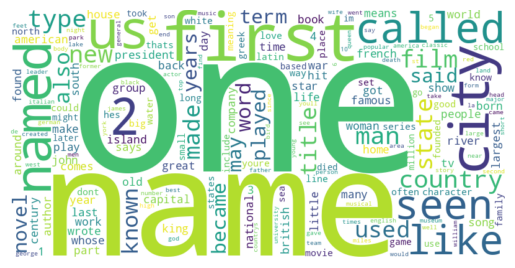

In [ ]:
df['Tokenized_Question'] = df['Cleaned_Question'].apply(nltk.word_tokenize)
stop_words = set(stopwords.words('english'))
df['Tokenized_Question'] = df['Tokenized_Question'].apply(lambda x: [word for word in x if word not in stop_words])

all_words = [word for tokens in df['Tokenized_Question'] for word in tokens]
word_freq = Counter(all_words)

wordcloud = WordCloud(width=800, height=400, background_color= 'white').generate_from_frequencies(word_freq)
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

Identify the most common words or phrases using CountVectorizer, after fitting and transforming the cleaned text, get the feature phrases, and sum the count of each. Then create a data frame and organize it by frequency and plot the common words.

In the initial code and visualization for top common words in Questions, we found that phrase asking crew members to provide clues were present in 8 out of the 20 more common words. We adjusted the code above to remove  phrases which contain parenthesis and 'crew' and 'clue'.

'New York is the top common phrase. There is a clear pattern of questions asking contestants to identify something similar ie 'also called', questions relating to names, and questions related to historical or political context.

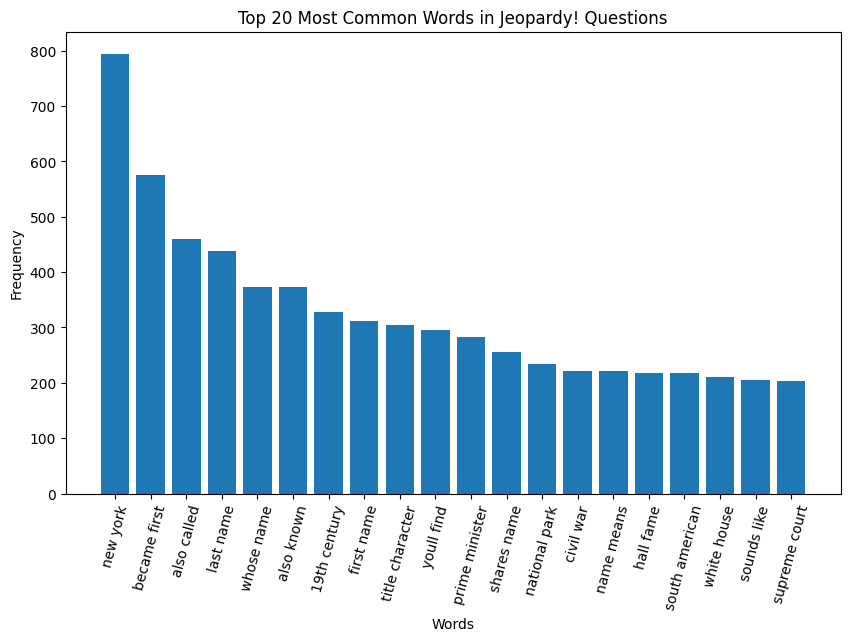

In [ ]:
bigrams = ngrams(all_words, 2)
bigram_freq = Counter(bigrams)

most_common_bigrams = bigram_freq.most_common(20)

bigrams, freqs = zip(*most_common_bigrams)
bigrams = [' '.join(bigram) for bigram in bigrams]
plt.figure(figsize = (10,6))
plt.bar(bigrams, freqs)
plt.xticks(rotation = 75)
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 20 Most Common Words in Jeopardy! Questions')
plt.show()

We also create a visual of 3 consecutive words to provide more context. This grapgh distinguishes between: New York City and New York Times, 'Supereme court' and 'Supreme court justice'
Here some new phrases are present such as 'Became the first woman', 'Nobal peace prize', 'talk show host', 'top 10 hit' etc.

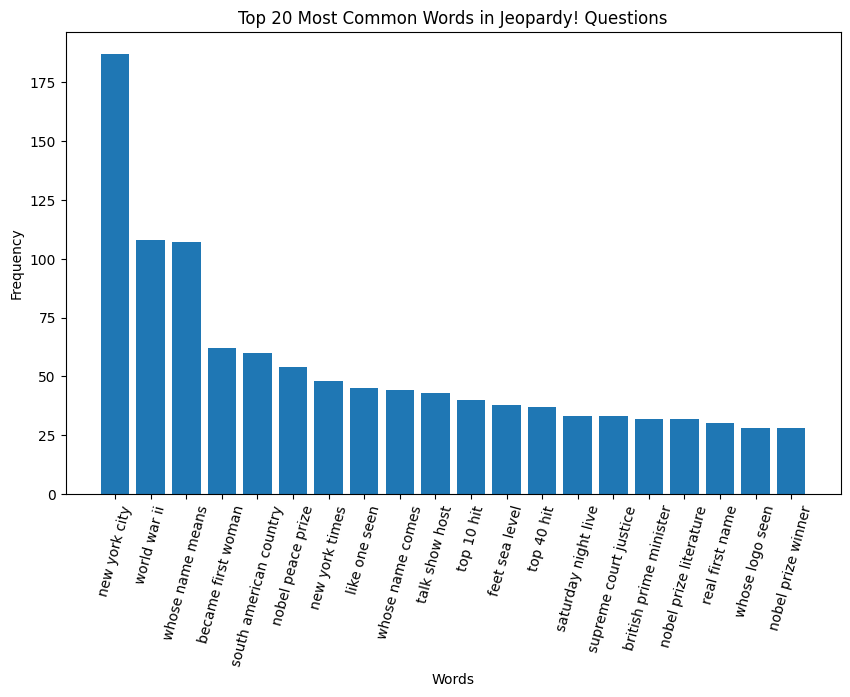

In [ ]:
trigrams = ngrams(all_words, 3)
trigram_freq = Counter(trigrams)

most_common_trigrams = trigram_freq.most_common(20)

trigrams, freqs = zip(*most_common_trigrams)
trigrams = [' '.join(trigram) for trigram in trigrams]
plt.figure(figsize = (10,6))
plt.bar(trigrams, freqs)
plt.xticks(rotation = 75)
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 20 Most Common Words in Jeopardy! Questions')
plt.show()

Duplicate the process for Answers column, and add function to return empty string for non-string values: NaN.

In [ ]:
def clean_text(text):
    if isinstance(text, str):
        text = text.lower()
        text = text.translate(str.maketrans('', '', string.punctuation))
        words = word_tokenize(text)
        stop_words = set(stopwords.words('english'))
        words = [word for word in words if word not in stop_words]
        return ' '.join(words)
    else:
        return ''

df['Cleaned_Answer'] = df[' Answer'].apply(clean_text)


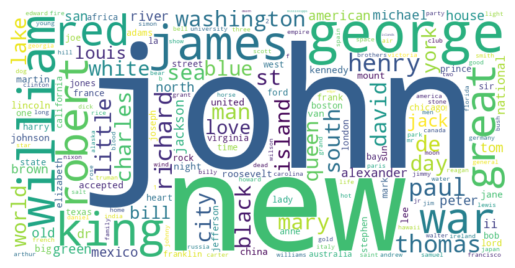

In [ ]:
df['Tokenized_Answer'] = df['Cleaned_Answer'].apply(nltk.word_tokenize)

stop_words = set(stopwords.words('english'))
df['Tokenized_Answer'] = df['Tokenized_Answer'].apply(lambda x: [word for word in x if word not in stop_words])
all_ans = [word for tokens in df['Tokenized_Answer'] for word in tokens]

ans_freq = Counter(all_ans)

wordcloud = WordCloud(width=800, height=400, background_color= 'white').generate_from_frequencies(ans_freq)
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

The top common words in the Answers is with the highest frequency is also 'New York'; a total of 9 cities, states and countries are found in the common words of Answers. Additionally 11 of the top common words in Answers are names with historical importance.


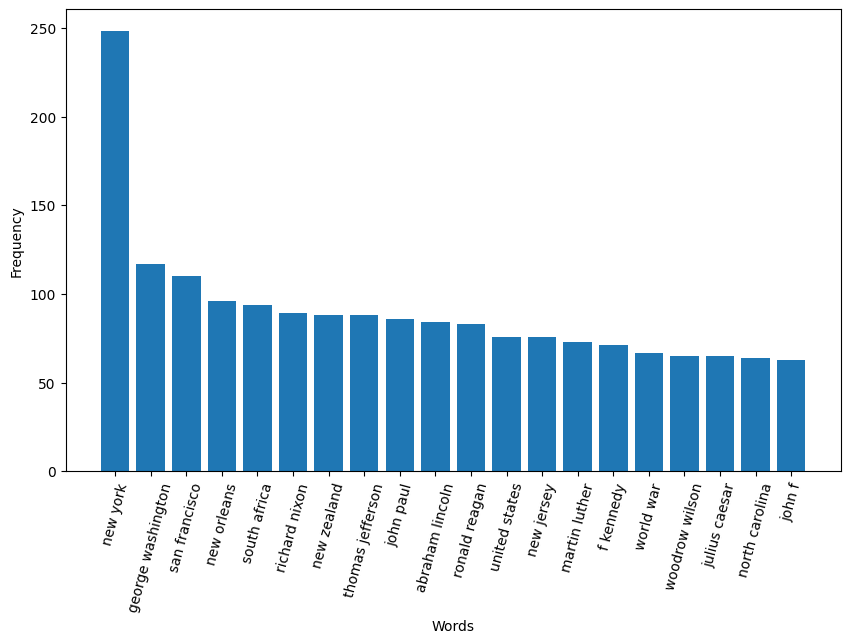

In [ ]:
bigrams = ngrams(all_ans, 2)
bigram_freq = Counter(bigrams)

most_common_bigrams = bigram_freq.most_common(20)

bigrams, freqs = zip(*most_common_bigrams)
bigrams = [' '.join(bigram) for bigram in bigrams]
plt.figure(figsize = (10,6))
plt.bar(bigrams, freqs)
plt.xticks(rotation = 75)
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.show()


Similarly, when extracting the 20 most common trigrams of answers we see some different results with John F Kennedy have the highest frequencys which aligns with the word cloud where 'john' is the biggest word. Here we also see some phrases not present in the grapgh above such as 'edgar allan poe', 'pop john paul' etc.

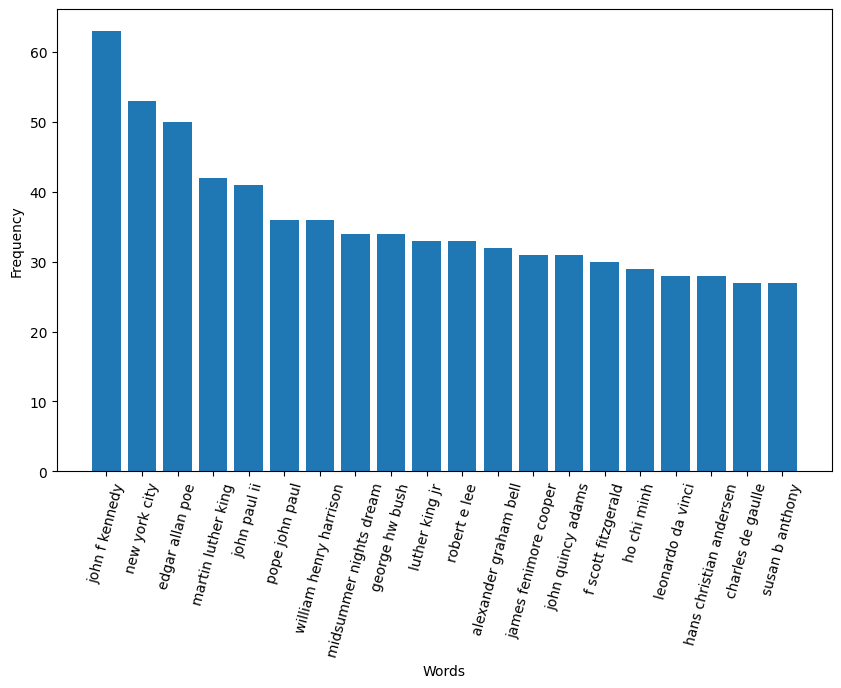

In [ ]:
bigrams = ngrams(all_ans, 3)
bigram_freq = Counter(bigrams)

most_common_bigrams = bigram_freq.most_common(20)

bigrams, freqs = zip(*most_common_bigrams)
bigrams = [' '.join(bigram) for bigram in bigrams]
plt.figure(figsize = (10,6))
plt.bar(bigrams, freqs)
plt.xticks(rotation = 75)
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.show()



 **Sentiment Analysis: Determine the sentiment of questions and answers:** Both the Questions and Answers are generally around 0, which suggests the text is neutral. Almost 140,000 of answers are neutral  (0) possibly because they tend to be shorter. Around 80,000 Questions were at the sentiment score of 0, with a wider range (compared to answers) of positive and negative sentiment score. They might have more emotional language; examples of questions with positive and negative sentiment were printed for context.


Initialize the SentimentIntensityAnalyzer, create function that applies sentiment analysis to each question or answer text using VADER (Valence Aware Dictionary and sentiment Reasoner). Apply the function to the 'Question' and 'Answer' columns of df.




In [ ]:
sid = SentimentIntensityAnalyzer()
def analyze_sentiment(text):
    if isinstance(text, str):
        sentiment_score = sid.polarity_scores(text)
        return sentiment_score['compound']
    else:
        return np.nan

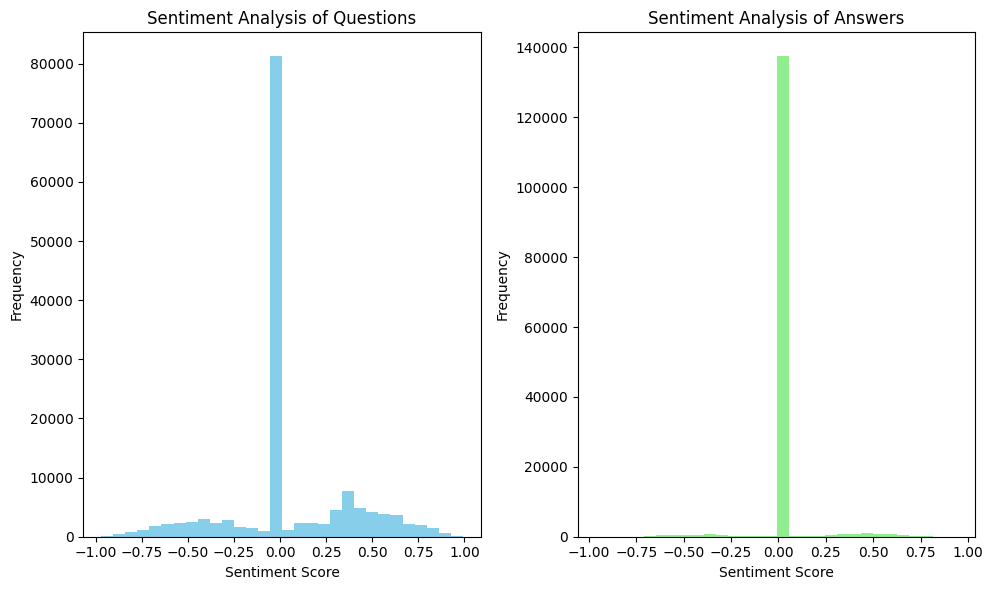

In [ ]:
df['Question_Sentiment'] = df[' Question'].apply(analyze_sentiment)

df['Answer_Sentiment'] = df[' Answer'].apply(analyze_sentiment)

# Visualize sentiment scores
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.hist(df['Question_Sentiment'], bins=30, color='skyblue')
plt.title('Sentiment Analysis of Questions')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(df['Answer_Sentiment'], bins=30, color='lightgreen')
plt.title('Sentiment Analysis of Answers')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [ ]:
positive_questions = df[df['Question_Sentiment'] > 0][' Question'].head(5)
negative_questions = df[df['Question_Sentiment'] < 0][' Question'].head(5)
print("Examples of Questions with Positive Sentiment:")
for idx, question in enumerate(positive_questions, start=1):
    print(f"{idx}. {question}")
print("\nExamples of Questions with Negative Sentiment:")
for idx, question in enumerate(negative_questions, start=1):
    print(f"{idx}. {question}")


Examples of Questions with Positive Sentiment:
1. No. 2: 1912 Olympian; football star at Carlisle Indian School; 6 MLB seasons with the Reds, Giants & Braves
2. The city of Yuma in this state has a record average of 4,055 hours of sunshine each year
3. Signer of the Dec. of Indep., framer of the Constitution of Mass., second President of the United States
4. In the title of an Aesop fable, this insect shared billing with a grasshopper
5. In the winter of 1971-72, a record 1,122 inches of snow fell at Rainier Paradise Ranger Station in this state

Examples of Questions with Negative Sentiment:
1. For the last 8 years of his life, Galileo was under house arrest for espousing this man's theory
2. No. 8: 30 steals for the Birmingham Barons; 2,306 steals for the Bulls
3. In 1000 Rajaraja I of the Cholas battled to take this Indian Ocean island now known for its tea
4. No. 1: Lettered in hoops, football & lacrosse at Syracuse & if you think he couldn't act, ask his 11 "unclean" buddies
5. Ou

# Network Analysis


In [ ]:
len(df['Show Number'].unique())


2518

In [ ]:
len(df[' Category'].unique())


19779

In [ ]:
G = nx.Graph()

In [ ]:
categories = df[' Category'].unique()
rounds = df[' Round'].unique()
value = df[' Value'].unique()
question = df[' Question'].unique()
show_number = df['Show Number'].unique()

Creating a Co-occurence Network


In [ ]:
show_categories = df.groupby('Show Number')[' Category'].apply(list)

In [ ]:
co_occurrence_counts = Counter()
for categories in show_categories:
    for cat1, cat2 in combinations(sorted(categories), 2):
        co_occurrence_counts[(cat1, cat2)] += 1

In [ ]:
G_cooccurrence = nx.Graph()
for (cat1, cat2), count in co_occurrence_counts.items():
    G_cooccurrence.add_edge(cat1, cat2, weight=count)

Nodes represent categories, and edges represent the co-occurrence between categories, with edge labels showing the weights (co-occurrence counts).

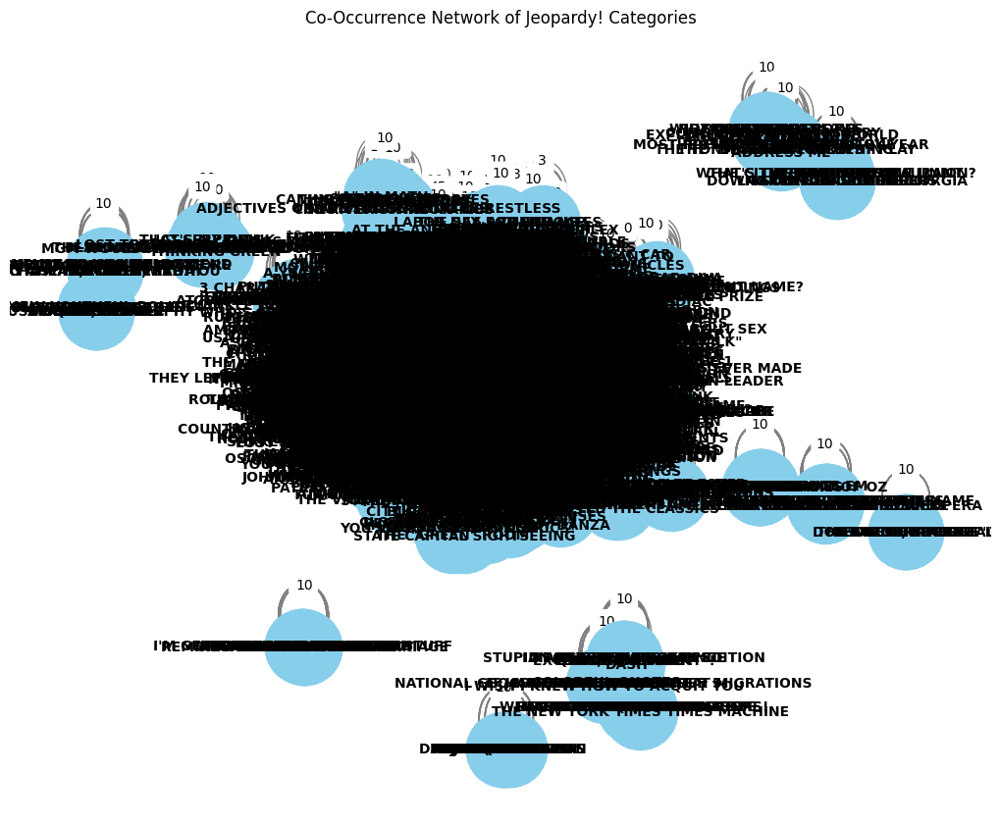

In [ ]:
pos = nx.spring_layout(G_cooccurrence)
plt.figure(figsize=(10, 8))
nx.draw(G_cooccurrence, pos, with_labels=True, node_size=3000, node_color='skyblue', font_size=10, font_weight='bold', edge_color='gray')
edge_labels = nx.get_edge_attributes(G_cooccurrence, 'weight')
nx.draw_networkx_edge_labels(G_cooccurrence, pos, edge_labels=edge_labels)
plt.title('Co-Occurrence Network of Jeopardy! Categories')
plt.show()

The number of unique category pairs that co-occur in the same show.

In [ ]:
# Number of edges in the co-occurrence network
num_edges = len(G_cooccurrence.edges())
print(f'Number of co-occurrence connections (edges): {num_edges}')


Number of co-occurrence connections (edges): 182598


With 19,779 unique categories, there are 182,598 connections between these categories. Each category is connected to approximately 18 other categories which suggests that while there is a significant amount of interconnection, it's not overly dense. The low density of 0.000933 indicates that the network is not heavily interconnected.

In [ ]:
# Total number of nodes and edges
num_nodes = len(G_cooccurrence.nodes())
num_edges = len(G_cooccurrence.edges())
print(f'Number of categories (nodes): {num_nodes}')
print(f'Number of co-occurrence connections (edges): {num_edges}')

# Average degree of the nodes (average number of connections per category)
average_degree = sum(dict(G_cooccurrence.degree()).values()) / num_nodes
print(f'Average Degree: {average_degree}')

# Density of the graph (proportion of possible edges that are present)
density = nx.density(G_cooccurrence)
print(f'Density of the Network: {density}')


Number of categories (nodes): 19779
Number of co-occurrence connections (edges): 182598
Average Degree: 18.463825269224934
Density of the Network: 0.0009335537096382312


In [ ]:
# Get degree centrality
degree_centrality = nx.degree_centrality(G_cooccurrence)

# Sort categories by degree centrality
sorted_categories = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

# Display top 10 most connected categories
print('Top 10 Most Connected Categories:')
for category, centrality in sorted_categories[:10]:
    print(f'{category}: {centrality}')


Top 10 Most Connected Categories:
BEFORE & AFTER: 0.0439377085650723
SCIENCE: 0.03584791182121549
LITERATURE: 0.031803013449287085
POTPOURRI: 0.03043786024876125
WORLD HISTORY: 0.025836788350692686
WORD ORIGINS: 0.02568510466174537
AMERICAN HISTORY: 0.02528061482455253
BODIES OF WATER: 0.02356153301648296
HISTORY: 0.023106481949641013
SHAKESPEARE: 0.022297502275255333


In [ ]:
G.add_nodes_from(categories, bipartite=0)
G.add_nodes_from(rounds, bipartite=1)

In [ ]:
co_occurrence_counts = Counter()

# Count co-occurrences of different category pairs
for categories in show_categories:
    for cat1, cat2 in combinations(sorted(set(categories)), 2):
        co_occurrence_counts[(cat1, cat2)] += 1

# Get the most frequent co-occurrence pairs
most_common_pairs = sorted(co_occurrence_counts.items(), key=lambda x: x[1], reverse=True)

# Display top 10 most frequent co-occurrence pairs
print('Most Frequent Co-Occurrence Pairs (Top 10):')
for (cat1, cat2), count in most_common_pairs[:10]:
    print(f'{cat1} - {cat2}: {count}')

Most Frequent Co-Occurrence Pairs (Top 10):
U.S. GEOGRAPHY - WORLD HISTORY: 6
ANIMALS - HISTORY: 6
AUTHORS - HISTORY: 6
GEOGRAPHY - SPORTS: 5
MUSIC - SPORTS: 5
BIRDS - WORLD GEOGRAPHY: 5
FOOD - SPORTS: 5
LITERATURE - WORLD HISTORY: 5
SCIENCE - WORLD HISTORY: 5
FASHION - SPORTS: 5


Looking at the pairs of Jeopardy categories, we can see that U.S. Geography and World History are the most common co-occurring categories. Additionally, we observe that "History" and "SPORTS" are frequently seen among other category pairs. Based on this analysis, if you are preparing for Jeopardy!, you should focus heavily on both "SPORTS" and "History."

Experimenting with filtered graph

In [ ]:
threshold = 2  # Example threshold value
filtered_edges = [(cat1, cat2, count) for (cat1, cat2), count in co_occurrence_counts.items() if count > threshold]

# Create the graph
G_cooccurrence2 = nx.Graph()
G_cooccurrence2.add_weighted_edges_from(filtered_edges)

Only category pairs that co-occur more than twice are retained in the network.

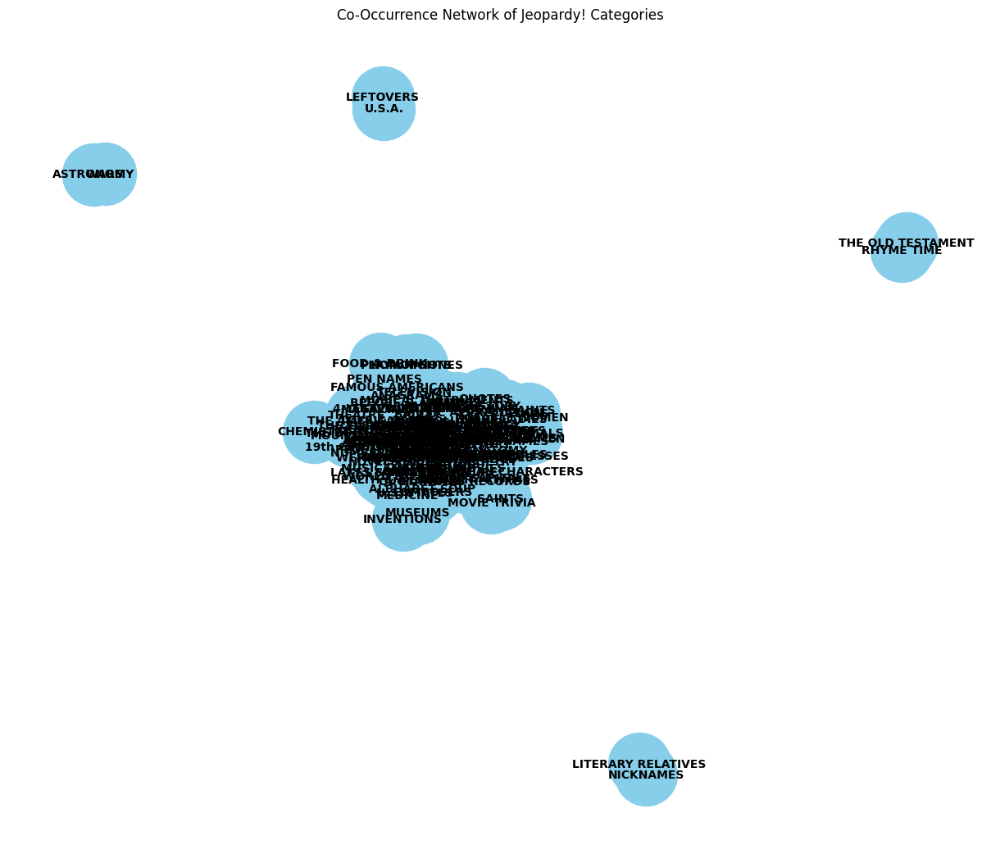

In [ ]:
pos = nx.spring_layout(G_cooccurrence2)
plt.figure(figsize=(12, 10))
nx.draw(G_cooccurrence2, pos, with_labels=True, node_size=3000, node_color='skyblue', font_size=10, font_weight='bold', edge_color='gray')
edge_labels = nx.get_edge_attributes(G_cooccurrence2, 'weight')
nx.draw_networkx_edge_labels(G_cooccurrence2, pos, edge_labels=edge_labels)
plt.title('Co-Occurrence Network of Jeopardy! Categories')
plt.show()

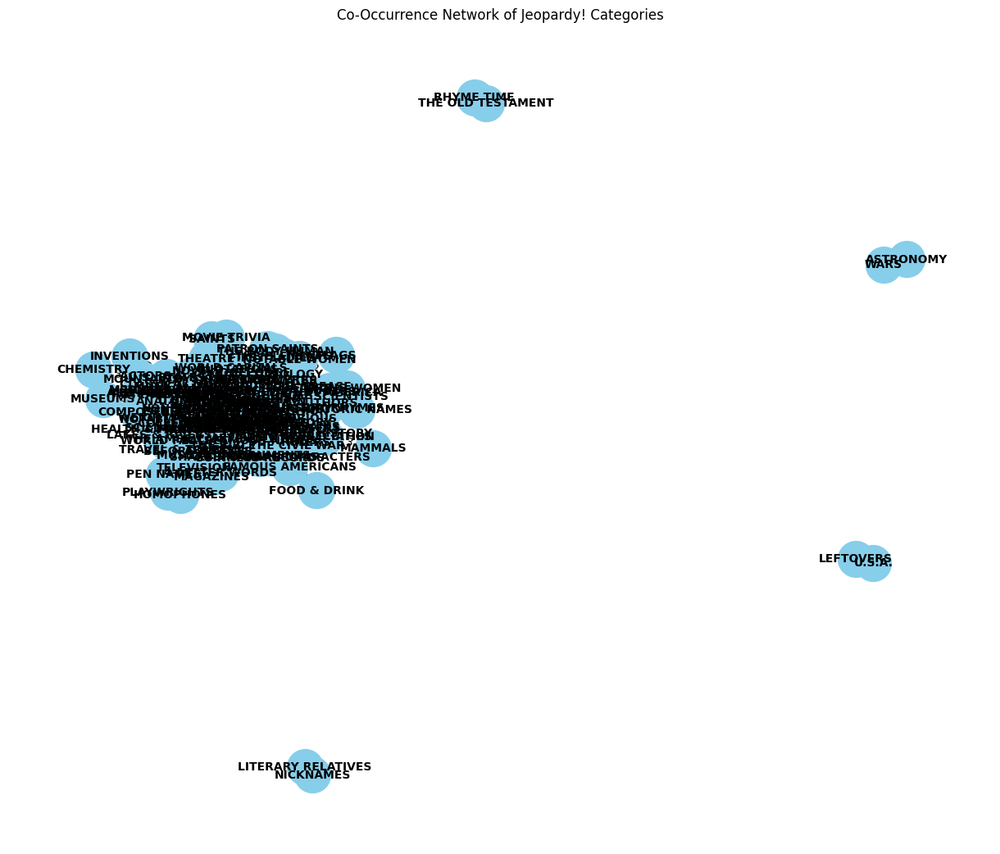

In [ ]:
pos = nx.spring_layout(G_cooccurrence2)
plt.figure(figsize=(12, 10))
nx.draw(G_cooccurrence2, pos, with_labels=True, node_size=1000, node_color='skyblue', font_size=10, font_weight='bold', edge_color='gray')
edge_labels = nx.get_edge_attributes(G_cooccurrence2, 'weight')
nx.draw_networkx_edge_labels(G_cooccurrence2, pos, edge_labels=edge_labels)
plt.title('Co-Occurrence Network of Jeopardy! Categories')
plt.show()

This visual helps us understand the relationships between different categories and how they are interconnected within the dataset. Edges, Trace 0, are shown as lines connecting nodes, representing the co-occurrences. Nodes, Trace 1, are shown as markers indicating the categories, with labels positioned above them.

In [ ]:
import plotly.graph_objects as go
pos = nx.spring_layout(G_cooccurrence)
edge_x = []
edge_y = []
for edge in G_cooccurrence.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_y.append(y0)
    edge_y.append(y1)

edge_trace = go.Scatter(x=edge_x, y=edge_y, mode='lines', line=dict(width=0.5, color='#888'))
node_x = []
node_y = []
for node in G_cooccurrence.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', text=list(G_cooccurrence.nodes()), textposition='top center')
fig = go.Figure(data=[edge_trace, node_trace])
fig.show()


# Modeling

One of our goals in this project is to predict category based on the body of text.

Originally, we use the full dataset for our modeling. However, our notebook kept crashing. We tried to sample 10% of the dataset. However, we ran into similar issues.

Finally, we sample the data that contains the top 10 frequent categories from the dataset.

We train and split the data; we trained the model using various classifiers. We used TF-IDF to convert our text into numerical features. It scales the data by how often the tokens appear, giving more importance to rare words.



We chose 3 classifer to train the dataset. These classes are useful for dataset that contain multiclasses.


*   Logistic Regression: This classifier works well with high dimensional data. But it assume independence between the features.
*   K-Nearest Neighbors (KNN): It is useful for small dataset and non-linear data.
*   Random Forest: It is useful against overfitting and can handle non-linear relationships.



To determine the best classifier among the ones we've trained we can compare their performace based the following metrics: accuracy, precision, F1-score.

From the computed metrics, Logistic Regression is the best classifier among the ones we've tried since it has the highest accuracy, precision, F1-score.

In [ ]:
top_categories = ['BEFORE & AFTER','SCIENCE','LITERATURE', 'POTPOURRI','WORLD HISTORY', 'WORLD ORIGNS', 'AMERICAN HISTORY', 'HISTORY','BODIES OF WATER','SPORT']
filtered_df = df[df[' Category'].isin(top_categories)]

## Models without Ngrams

### Model 1

Classifier: Logistic Regression

In [ ]:


#label_encoder = LabelEncoder()
#filtered_df['Category label'] = label_encoder.fit_transform(filtered_df[' Category'])
# warning <ipython-input-14-9332bd829897>:11: SettingWithCopyWarning:
#A value is trying to be set on a copy of a slice from a DataFrame.
#Try using .loc[row_indexer,col_indexer] = value instead

#See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

X = filtered_df['Cleaned_Question']
y = filtered_df[' Category']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline with TF-IDF
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english')),
    ('clf', LogisticRegression(max_iter=1000)),
])

# Train the pipeline
pipeline.fit(X_train, y_train)

# Predict the answers for the test set
y_pred = pipeline.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')
print(classification_report(y_test, y_pred))

Accuracy: 58.28%
                  precision    recall  f1-score   support

AMERICAN HISTORY       0.61      0.43      0.50        47
  BEFORE & AFTER       0.52      0.74      0.61        81
 BODIES OF WATER       0.87      0.92      0.90        52
         HISTORY       0.31      0.19      0.23        43
      LITERATURE       0.77      0.71      0.74        68
       POTPOURRI       0.43      0.18      0.26        65
         SCIENCE       0.56      0.84      0.67        69
   WORLD HISTORY       0.44      0.46      0.45        52

        accuracy                           0.58       477
       macro avg       0.56      0.56      0.55       477
    weighted avg       0.57      0.58      0.56       477



### Model 2

Classifier: Random Forest

In [ ]:
X = filtered_df['Cleaned_Question']
y = filtered_df[' Category']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline with TF-IDF
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english')),
    ('clf', RandomForestClassifier()),
])

# Train the pipeline
pipeline.fit(X_train, y_train)

# Predict the answers for the test set
y_pred = pipeline.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')
print(classification_report(y_test, y_pred))

Accuracy: 52.62%
                  precision    recall  f1-score   support

AMERICAN HISTORY       0.56      0.49      0.52        47
  BEFORE & AFTER       0.59      0.42      0.49        81
 BODIES OF WATER       0.81      0.92      0.86        52
         HISTORY       0.29      0.23      0.26        43
      LITERATURE       0.73      0.71      0.72        68
       POTPOURRI       0.25      0.46      0.33        65
         SCIENCE       0.63      0.58      0.61        69
   WORLD HISTORY       0.49      0.35      0.40        52

        accuracy                           0.53       477
       macro avg       0.54      0.52      0.52       477
    weighted avg       0.55      0.53      0.53       477



### Model 3

Classifier: KNeighbors


In [ ]:
X = filtered_df['Cleaned_Question']
y = filtered_df[' Category']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline with TF-IDF
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english')),
    ('clf', KNeighborsClassifier()),
])

# Train the pipeline
pipeline.fit(X_train, y_train)

# Predict the answers for the test set
y_pred = pipeline.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')
print(classification_report(y_test, y_pred))

Accuracy: 45.28%
                  precision    recall  f1-score   support

AMERICAN HISTORY       0.34      0.53      0.41        47
  BEFORE & AFTER       0.38      0.54      0.44        81
 BODIES OF WATER       0.64      0.90      0.75        52
         HISTORY       0.25      0.21      0.23        43
      LITERATURE       0.59      0.51      0.55        68
       POTPOURRI       0.28      0.14      0.19        65
         SCIENCE       0.64      0.52      0.58        69
   WORLD HISTORY       0.37      0.21      0.27        52

        accuracy                           0.45       477
       macro avg       0.44      0.45      0.43       477
    weighted avg       0.45      0.45      0.44       477



## Models without Ngrams



### Model 4

Classifier: LogisticRegression

This model includes unigram and bigram only. Including more ngrams decreases the accuracy.

In [ ]:
X = filtered_df['Cleaned_Question']
y = filtered_df[' Category']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline with TF-IDF
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english', ngram_range=(1,2))),
    ('clf', LogisticRegression(max_iter=1000)),
])

# Train the pipeline
pipeline.fit(X_train, y_train)

# Predict the answers for the test set
y_pred = pipeline.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')
print(classification_report(y_test, y_pred))


Accuracy: 57.65%
                  precision    recall  f1-score   support

AMERICAN HISTORY       0.59      0.40      0.48        47
  BEFORE & AFTER       0.48      0.74      0.58        81
 BODIES OF WATER       0.88      0.94      0.91        52
         HISTORY       0.33      0.14      0.20        43
      LITERATURE       0.77      0.71      0.74        68
       POTPOURRI       0.50      0.15      0.24        65
         SCIENCE       0.55      0.84      0.66        69
   WORLD HISTORY       0.43      0.48      0.45        52

        accuracy                           0.58       477
       macro avg       0.57      0.55      0.53       477
    weighted avg       0.57      0.58      0.55       477



### Model 5

Classifier: Random Forest

This model includes unigram, bigram and trigram. Including these ngrams increases the accuracy from model 2.

In [ ]:
X = filtered_df['Cleaned_Question']
y = filtered_df[' Category']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline with TF-IDF
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english', ngram_range=(1,3))),
    ('clf', RandomForestClassifier()),
])

# Train the pipeline
pipeline.fit(X_train, y_train)

# Predict the answers for the test set
y_pred = pipeline.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')
print(classification_report(y_test, y_pred))

Accuracy: 52.41%
                  precision    recall  f1-score   support

AMERICAN HISTORY       0.51      0.40      0.45        47
  BEFORE & AFTER       0.60      0.44      0.51        81
 BODIES OF WATER       0.83      0.92      0.87        52
         HISTORY       0.32      0.14      0.19        43
      LITERATURE       0.72      0.65      0.68        68
       POTPOURRI       0.30      0.52      0.38        65
         SCIENCE       0.49      0.65      0.56        69
   WORLD HISTORY       0.47      0.35      0.40        52

        accuracy                           0.52       477
       macro avg       0.53      0.51      0.51       477
    weighted avg       0.54      0.52      0.52       477



### Model 6

Classifier: KNeighbors

This model includes unigram, bigram and trigram. Including these ngrams increases the accuracy from model 2.



In [ ]:
X = filtered_df['Cleaned_Question']
y = filtered_df[' Category']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline with TF-IDF
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english', ngram_range=(1,3))),
    ('clf', KNeighborsClassifier()),
])

# Train the pipeline
pipeline.fit(X_train, y_train)

# Predict the answers for the test set
y_pred = pipeline.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')
print(classification_report(y_test, y_pred))

Accuracy: 45.91%
                  precision    recall  f1-score   support

AMERICAN HISTORY       0.30      0.40      0.34        47
  BEFORE & AFTER       0.41      0.53      0.46        81
 BODIES OF WATER       0.68      0.90      0.78        52
         HISTORY       0.26      0.21      0.23        43
      LITERATURE       0.56      0.51      0.54        68
       POTPOURRI       0.28      0.18      0.22        65
         SCIENCE       0.63      0.64      0.63        69
   WORLD HISTORY       0.32      0.19      0.24        52

        accuracy                           0.46       477
       macro avg       0.43      0.45      0.43       477
    weighted avg       0.44      0.46      0.44       477



# Conclusion

In this project, we did the following:


*   Load the Jeopardy! dataset
*   Preprocess the data by converting text to lowerzase, removing puntuations, stopwords, and more
*   Text Processing
*   Sentiment Analysis
*   Network Analysis
*   Predictive Modeling


**Change over time**
Between 1995-2000 some categories were asked in much higher frequencies; however, they average out between 2005-2012. By Normalizing frequencies we were able to identify that 'before and after' was a new category in late 1990's. While it looks like some years have more questions than others, the dataset used in this project is not the complete Jeopardy! dataset.

**Text Processing**
In the word cloud of Questions, 'one' and 'name' were visually the largest. Bigram of the questions indicated that 'New York' is the top common phrase. There is a clear pattern of questions asking contestants to identify something similar ie 'also called', questions relating to names, and historical or political context.  Similarly, in the Answers wordcloud,'John' and 'new' were the largest words. The top common words in the Answers is with the highest frequency is also 'New York'. 11 of the top common words in Answers are names with historical importance. For both trigrams provided more context some interesting distinctions.

**Sentiment Analysis**
Both the Questions and Answers are generally around 0, which suggests the text is neutral. Questions had a wider range of positive and negative sentiment score.

**Network Analysis**
Looking at the pairs of Jeopardy categories, we can see that U.S. Geography and World History are the most common co-occurring categories. Additionally, we observe that "History" and "SPORTS" are frequently seen among other category pairs. Based on this analysis, if you are preparing for Jeopardy!, you should focus heavily on both "SPORTS" and "History."

**Predictive Modeling**
In attempt to predict category based on the body of text, we used 3 different models and added ngrams to each to assess their accuracy. We found that the Logistic Regression model (with no ngrams) is the best classifier among the ones we've tried since it has the highest accuracy, precision, F1-score.


**Further Enhancement**

Our original model includes all data. However, we came upon these problems that prevented us to use the full dataset and include more features:

*   long run time
*   notebook crashing before the code finish running

With more time we would have liked to advance our network analysis and construct a network to determine which Jeopardy category is worth more. Additionally, we were unable to conduct temporal Analysis: based on the air data, analyze how categories, questions, or answers evolve over time.

If we have more time, we want to try modeling with more of our dataset, potentially using methods such as LDA to reduce the feature space and include additional feature engineering steps like lemmatization, text length, and more.

